# 🐶 Dog Breed Classification

This notebook builds an end-to-end multiclass image classifier using TensorFlow and TensorFlow hub

## 1. Problem

Indetify the breed of a dog given a image of dog

When I'm sitting at the cafe and I take photo of a dog, I want to know what bread of dog it is.

## 2. Data
The dataset we using is from Kaggle's dog breed indetification competition. https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation
The evaluation is a file with prediction probabilites for each dog breed of each test image

https://www.kaggle.com/c/dog-breed-identification/overview

## 4. Features
Some informations about the data:
* We're dealing with images (unstructured data)
* The dataset comprises 120 breeds of dogs.
* Each image has a filename that is its unique id.
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels).

### Get our workspace ready
* Load the data
* Import TensorFlow version > 2
* Import TensorFlow Hub
* Verify if we're using the GPU

In [ ]:
# Unpack the zip file
#!unzip 'drive/MyDrive/Dog vision/dog-breed-identification.zip' -d 'drive/MyDrive/Dog vision'

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub

print('TF version', tf.__version__)
print('TF hub version', hub.__version__)

# verify if we using the CPU
print('GPU', 'available' if tf.config.list_physical_devices("GPU") else
      "not available")

TF version 2.17.1
TF hub version 0.16.1
GPU available


## Getting our data ready (tuning with tensors)

The machine learning needs a data in numerical format. So we're tuning our images into Tensor(numerical represetations)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Checkout the labels of data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Dog vision/labels.csv')
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

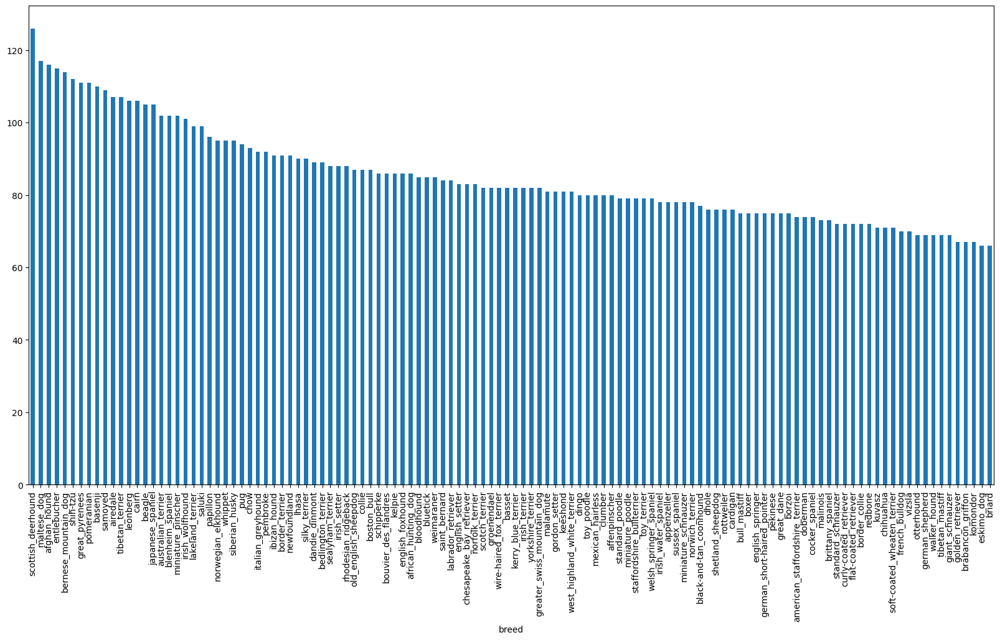

In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
(labels_csv['breed'] == 'shih-tzu').sum()

112

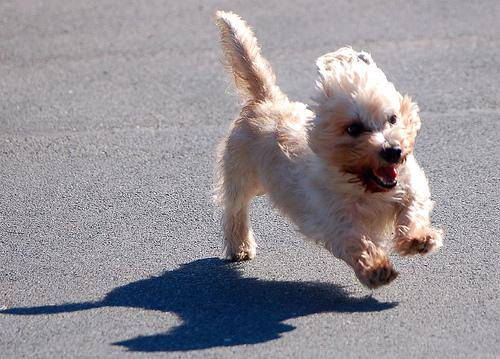

In [ ]:
from IPython.display import Image
Image('drive/MyDrive/Dog vision/train/ffd3f636f7f379c51ba3648a9ff8254f.jpg')

### Getting images and their labels

Get a list of all of our images file pathnames

In [ ]:
# Create a pathnames from Image ID
filenames = [f'drive/MyDrive/Dog vision/train/{fname}.jpg' for fname in labels_csv['id']]
# check the first 10
filenames[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether numbers of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog vision/train/')) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do no match amount of files")

Filenames match actual amount of files.


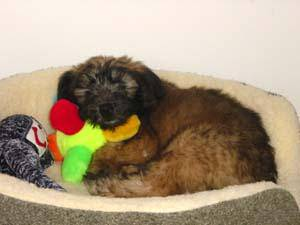

In [ ]:
# One more check
Image(filenames[2007])

In [ ]:
labels_csv['breed'][2007]

'soft-coated_wheaten_terrier'

## Tuning data labes into numbers

In [ ]:
import numpy as np

labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if numbers of labels matches with number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match of filenames")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[4:6]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# tuning boolean array into integres
print(labels[0])
print(np.where(unique_breeds == labels[0])) #index where labels occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the datase from Kaggle doesn't come with a validation set, we're going to create our own

In [ ]:
# setup X & y
X = filenames
y = boolean_labels

In [ ]:
len(X), len(boolean_labels)

(10222, 10222)

We're starting with +=1000 examples and increase as needeed

In [ ]:
# set number of images to use experimetating
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
# let split our data into train and validadtion
from sklearn.model_selection import train_test_split

np.random.seed(7)

# Split the data into train and validation
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES],
                                                  test_size=0.2)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing images(tuning images with Tensors)

1. Take a image as input
2. Use tensorflow to read the file and save it to a variabel `image`
3. Turn our `image` (jpg) into Tensors
4. Resize the `image` to be a shape of (224, 244)
5. Return the modified image

First we convert the image into numpy arrays
You can read more about - https://en.wikipedia.org/wiki/Channel_(digital_image)

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[7])
image.shape

(227, 231, 3)

In [ ]:
# get a tensorf flow objetc
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 231, 3), dtype=uint8, numpy=
array([[[ 76,  97,  58],
        [ 80, 101,  62],
        [ 84, 104,  67],
        ...,
        [ 67,  82,  51],
        [ 67,  82,  51],
        [ 37,  52,  19]],

       [[ 91, 112,  73],
        [ 94, 115,  76],
        [ 93, 113,  76],
        ...,
        [ 89, 102,  74],
        [ 83,  96,  66],
        [ 71,  84,  54]]], dtype=uint8)>

In [ ]:
# Define a image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes a image file path and turn the image into a Tensor
  filepath = path image
  return modified image
  """
  # read a image in file
  image = tf.io.read_file(image_path)
  # turn the jpg file into numerical tensorflow with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1 values (more efficentily)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
print(process_image(filenames[1000])[:2])

tf.Tensor(
[[[0.40355396 0.40747553 0.3878677 ]
  [0.42454413 0.43630883 0.40885785]
  [0.41331643 0.43726367 0.3972088 ]
  ...
  [0.50615615 0.5001623  0.41801825]
  [0.4627195  0.5086325  0.37880042]
  [0.45986548 0.52047455 0.3806636 ]]

 [[0.419756   0.42367756 0.40014815]
  [0.4162882  0.42678818 0.39996955]
  [0.40400913 0.42740723 0.38760507]
  ...
  [0.5021044  0.5140879  0.43164742]
  [0.50086445 0.5417147  0.44339326]
  [0.49901006 0.54256105 0.44339326]]], shape=(2, 224, 3), dtype=float32)


## Tuning our data into batches

If process to 10,000 images in one go, probabily not fit into memory.

Because we used a batch, it's possible to do with 32 images (batch size)

In [ ]:
# create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, preprocess the image
  and return a typle of (image, label)
  """
  image = process_image(image_path)

  return image, label

In [ ]:
(process_image(X[7]), y[7])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.2947821 , 0.37713507, 0.21635073],
         [0.31090194, 0.3932549 , 0.23283823],
         [0.32603866, 0.40838957, 0.25545248],
         ...,
         [0.25640866, 0.32302278, 0.197563  ],
         [0.25904348, 0.3256576 , 0.19276826],
         [0.14387392, 0.21048808, 0.06951292]],
 
        [[0.35644123, 0.4387942 , 0.27816743],
         [0.36464927, 0.44699854, 0.2867394 ],
         [0.36235476, 0.4443287 , 0.29214552],
         ...,
         [0.34232292, 0.400595  , 0.28017828],
         [0.31707633, 0.37542352, 0.25418106],
         [0.27222458, 0.33057544, 0.20175646]],
 
        [[0.32923725, 0.41159022, 0.25864902],
         [0.36068094, 0.44285005, 0.29027653],
         [0.38049302, 0.45892438, 0.31382632],
         ...,
         [0.28850666, 0.3192227 , 0.22551946],
         [0.22816728, 0.2624959 , 0.15793437],
         [0.31361404, 0.34812033, 0.2430258 ]],
 
        ...,
 
        [[0.48473474, 0.57832706

In [ ]:
# Define the batch size = 32
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates bathces of data out of image (X) and label(y) pairs.
  X=input dataset
  --Default variables--
  y=None,
  batch_size=BATCH_SIZE,
  valid_data=False,
  test_data=False
  """
  # If the data is a test dataset, we probabily don't have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepath not labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    # turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # labels
    # shuffling pathnames and labels before mapping image processor function is faster than shuffled
    data = data.shuffle(buffer_size=len(X))

    # crete a tuple (image, label)
    data = data.map(get_image_label)

    #turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [ ]:
# Creating a training and validation data bratchs
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches
Creating validation data batches


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand. we can visualizate better using matplolib

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in data batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a data batch
  """
  # setup the figure
  plt.figure(figsize=(15, 10))
  # loop through 25
  for i in range(25):
    # Create a subplots
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid line off
    plt.axis('off')

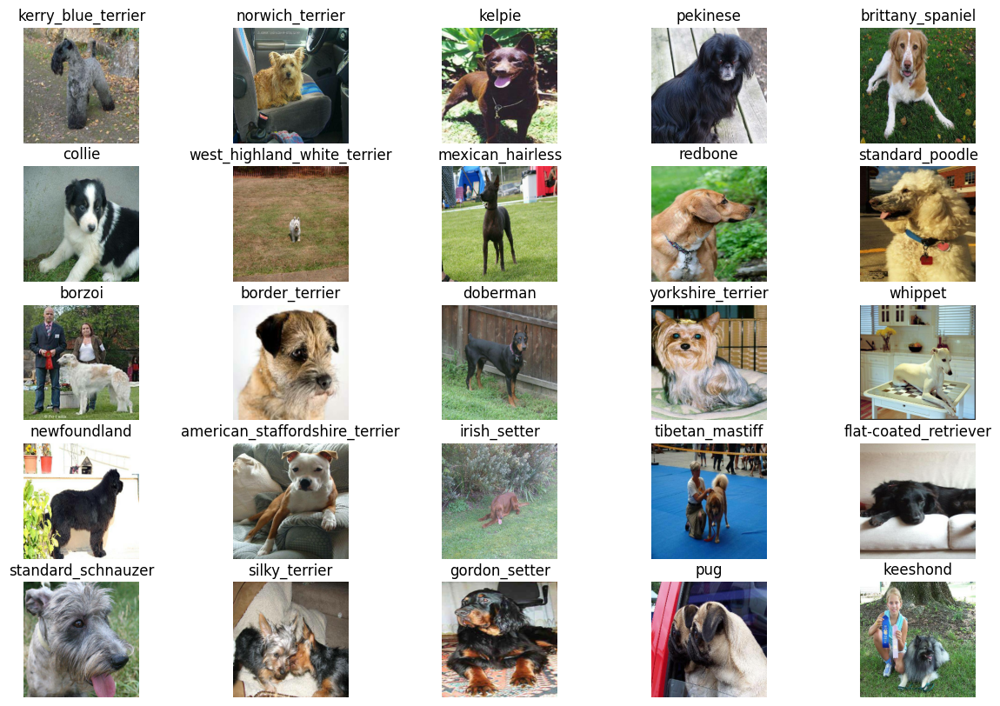

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

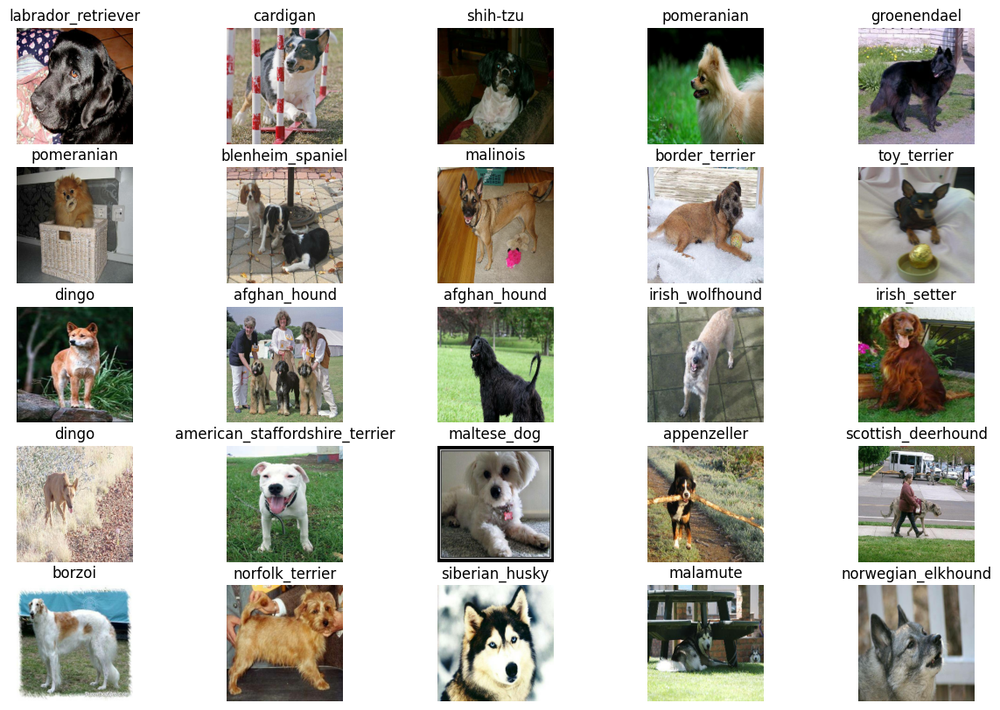

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before build a model, we need to define the:
* Input shape (images shape in format of Tensor) to our model
* The output shape (images labels in format of Tensor) of our model
* The URL of the model we want to use.

In tensorflow hub - https://www.tensorflow.org/hub?hl=pt-br

In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, coulour channels
# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)
# setup model URL from TensorFlow HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
INPUT_SHAPE, OUTPUT_SHAPE, MODEL_URL

([None, 224, 224, 3],
 120,
 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4')

Now we have the inputs outputs and the model we put them together using a Keras Deep Learning model.
We need a function which make the steps on the https://www.tensorflow.org/guide/keras?hl=pt-br

In [ ]:
import tf_keras as keras

# create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building a model with:", model_url)


  # setup the model layers
  model = keras.Sequential([
    hub.KerasLayer(model_url),# Layer1(input layers)
    keras.layers.Dense(units=output_shape,
                            activation='softmax') #layer2 (output layer)
  ])

  # compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # build the model
  model.build(input_shape)

  return model

model = create_model()
model.summary()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such of things like, check it's progess or stop training early if a model stops improving

We'll create two callbacks
1. on TensorBoard
2. Early stopping to prevents a model from training for too long.

### TensorBoard Callback
To setup the TensorBoard:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard which can save logs to a directory and pass it to our model's `fit` function
3. Visualize our models training logs with the `%tensorboard`

In [ ]:
# load tensorflow notebook extension
%load_ext tensorboard

import datetime
import os

# create a function to build a TensorFlow Callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%H%M%S-%d%m%Y"))
  return keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Support a model to avoid the overfitting by model

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callbacks
early_stopping = keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                               patience=3)

## Training a model (subset data)

We go to train our model with 1000 images to make test more fast.

In [ ]:
# define how many division on the image the model do
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # create a model
  model = create_model()

  # create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # return the fitted model
  return model


In [ ]:
model = train_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 290s 12s/step - loss: 4.6009 - accuracy: 0.0887 - val_loss: 3.4365 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 138ms/step - loss: 1.6510 - accuracy: 0.6825 - val_loss: 2.1469 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 6s 220ms/step - loss: 0.5879 - accuracy: 0.9212 - val_loss: 1.6997 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 4s 164ms/step - loss: 0.2600 - accuracy: 0.9787 - val_loss: 1.5378 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 5s 196ms/step - loss: 0.1478 - accuracy: 0.9987 - val_loss: 1.4658 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 5s 213ms/step - loss: 0.1016 - accuracy: 1.0000 - val_loss: 1.4395 - val_accuracy: 0.6500
Epoch 7/100
25/25 [============================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will acess the logs directory we create and vizualize the content

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Evaluating Predictions using a trained model

In [ ]:
# make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 126ms/step


array([[3.13457567e-05, 2.66173392e-05, 3.63609132e-07, ...,
        5.31068463e-06, 3.72683212e-06, 9.35034768e-06],
       [2.10588350e-05, 5.81086024e-05, 2.70280382e-03, ...,
        2.24284432e-03, 1.60439115e-03, 8.45699742e-06],
       [2.44612135e-02, 8.35584706e-06, 1.08142704e-05, ...,
        2.92349214e-05, 1.02620754e-04, 1.09587840e-04],
       ...,
       [5.59450164e-05, 3.30563565e-03, 4.96285793e-04, ...,
        2.27860481e-01, 2.29311016e-04, 1.13859423e-03],
       [7.89906248e-04, 3.20814388e-06, 2.07936391e-05, ...,
        2.21167153e-04, 8.98055296e-05, 1.58257957e-04],
       [2.31327631e-05, 2.95484938e-06, 2.42996612e-03, ...,
        1.26443105e-03, 8.39121276e-06, 2.07597204e-03]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# first prediction
index = 7

print(predictions[index])
print(f"Max value (probabilty of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.11102483e-05 3.54888653e-05 5.07952995e-04 1.95008361e-05
 7.30706597e-05 4.02390870e-05 1.22352823e-04 4.67241480e-04
 5.74524711e-05 1.32267960e-04 6.19211860e-05 1.47432205e-04
 8.11364880e-05 2.87851253e-05 7.64572877e-04 2.23824827e-05
 3.22053500e-04 3.19399200e-02 3.36026619e-06 1.29108643e-03
 8.78842111e-05 7.35215144e-05 3.82855767e-04 2.40292993e-05
 2.61338046e-05 8.53158301e-04 1.81179540e-03 1.02972137e-02
 9.23977757e-04 3.92816169e-03 4.12702066e-05 5.01637442e-06
 5.63040703e-05 3.76084208e-05 2.71303961e-05 9.06287823e-06
 1.46322971e-04 6.04258501e-04 1.83919605e-04 4.21516248e-04
 5.56727318e-05 3.27610223e-06 4.40961321e-06 3.25207584e-05
 5.24433854e-04 1.12159985e-04 5.71841327e-03 6.04419256e-05
 2.22725866e-05 2.08870554e-03 4.73226573e-05 2.33830593e-04
 3.70861221e-06 6.95242314e-04 2.32276452e-05 4.48509207e-04
 2.76022591e-04 1.21394999e-03 1.44025471e-04 2.36071894e-04
 8.58641812e-04 1.97376885e-05 6.52095187e-04 2.14475277e-03
 5.64189577e-06 2.655910

We need to able to do this at scale. And it would be even better if we could see the image the prediction

In [ ]:
# turn the prediction probabiites into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# get a prediction label based on an array of prediction labels
pred_label = get_pred_label(predictions[0])
pred_label

In [ ]:
# create a function to unbatch  a batch data
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and return separate arrays
  of images and labels
  """

  images = []
  labels = []
  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [ ]:
# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

In [ ]:
get_pred_label(val_labels[0])

'labrador_retriever'

In [ ]:
get_pred_label(predictions[0])

'labrador_retriever'

In [ ]:
import matplotlib.pyplot as plt

def plot_pred(predictions_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = predictions_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot a image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the colour of the title
  if pred_label == true_label:
    color='green'
    plt.title(f"{pred_label} {np.max(pred_prob)*100:2.0f}%", color=color)
  else:
    color='red'
    plt.title(f"{pred_label} {np.max(pred_prob)*100:2.0f}% Correct:{true_label}", color=color)


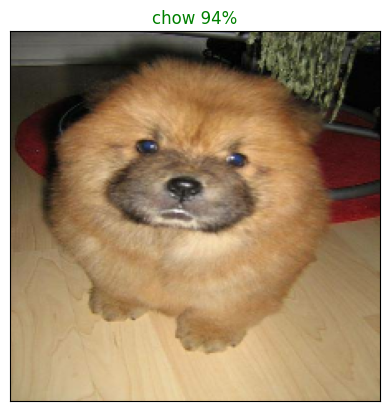

In [ ]:
# an example of correct prediction
plot_pred(predictions_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=123)

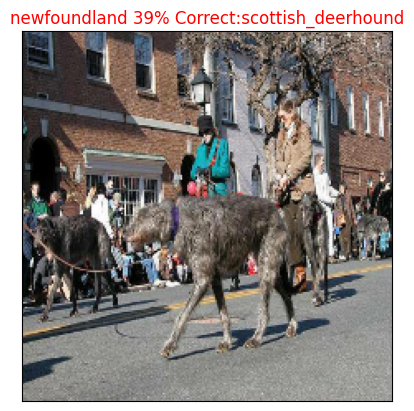

In [ ]:
# an example of wrong prediction
plot_pred(predictions_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=88)

Let's visualize our models top prediction, make to view of our models top 10 predictions

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 predictions confidece index
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # find the top 10 predictions confidece values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  bar_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  if np.isin(true_label, top_10_pred_labels):
    bar_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')

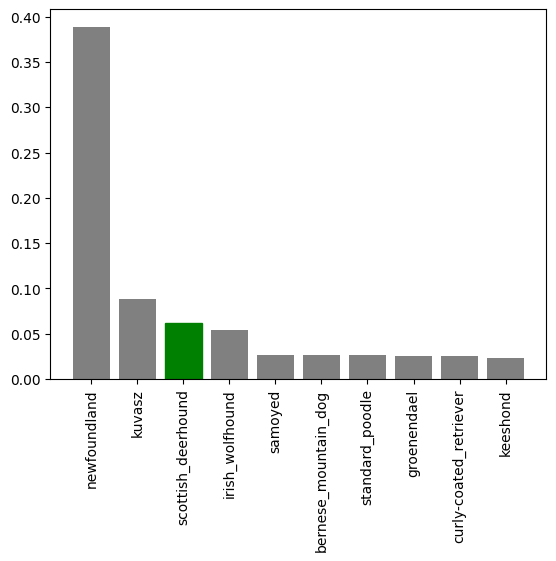

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=88)

Now we build a function to help us visualize our predictions

In [ ]:
def plot_image_pred_conf(predictions, num_rows, ind_image):
  num_cols = 2
  num_images = num_rows * num_cols

  plt.figure(figsize=(10*num_cols,  5*num_rows))
  plt.title('Images and top Predictions')
  # remove the ticks of principal figure
  plt.xticks([])
  plt.yticks([])

  for i in range(num_images):
    # plot the data in each figure
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(predictions_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+ind_image)

    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
              labels=val_labels,
              n=i+ind_image)

  # make the each figure is in a equal space
  plt.tight_layout(h_pad=1.0)
  plt.show()

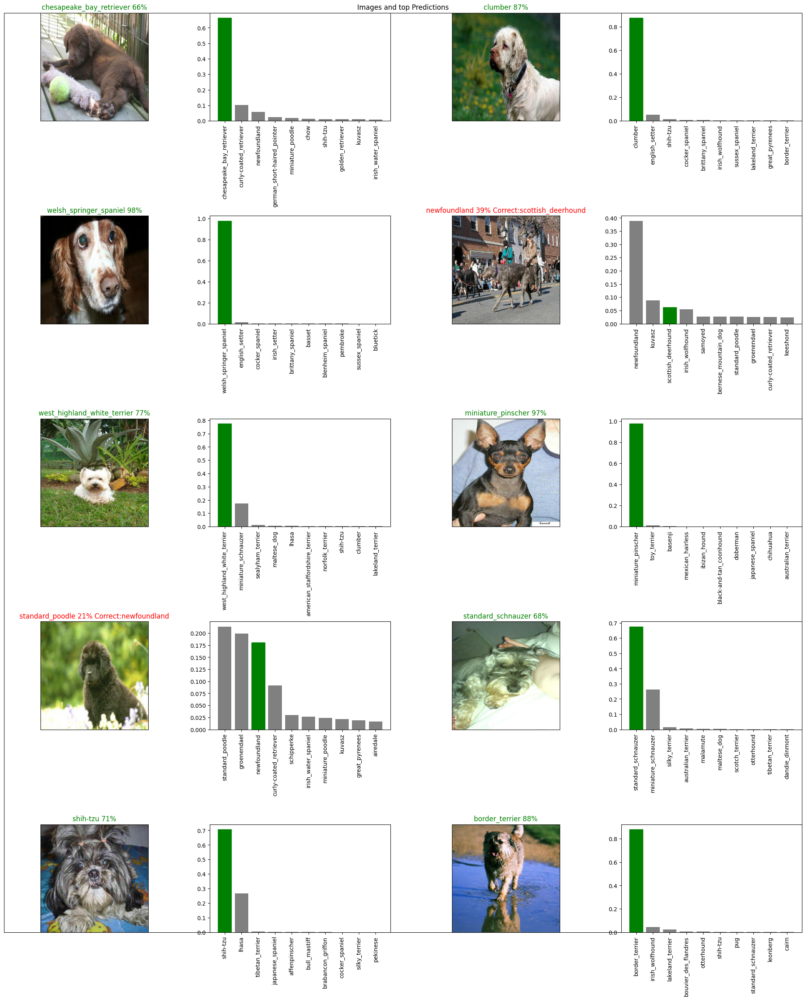

In [ ]:
plot_image_pred_conf(predictions=predictions,
                    num_rows=5,
                    ind_image=85)

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model

def save_model(model, suffix='None'):
  """
  Saves a given model in a models directory and appends suffix(string)
  """
  # Create a model directory
  model_dir = os.path.join('drive/MyDrive/Dog vision/models',
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = f'{model_dir}-{suffix}.h5' # save in a format model
  print(f'Saving model to {model_path}')
  model.save(model_path)

  return model_path

In [ ]:
# create a function to load a trained model
def load_model(model_path):
  """
  Load a save model from a specified path
  """
  print(f'Loading a saving model from {model_path}')
  model = keras.models.load_model(model_path,
                                  custom_objects={"KerasLayer":hub.KerasLayer})

  return model

In [ ]:
# save our model trained on 1000 images
model_path = save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to drive/MyDrive/Dog vision/models/20241220-01391734658755-1000-images-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
loaded_model = load_model(model_path)

Loading a saving model from drive/MyDrive/Dog vision/models/20241220-01391734658755-1000-images-mobilenetv2-Adam.h5


In [ ]:
# evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 127ms/step - loss: 1.3020 - accuracy: 0.6850


[1.3019617795944214, 0.6850000023841858]

In [ ]:
# evaluate the loaded model
loaded_model.evaluate(val_data)

7/7 [==============================] - 2s 151ms/step - loss: 1.3020 - accuracy: 0.6850


[1.3019617795944214, 0.6850000023841858]

## Training a model on the full data

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches


In [ ]:
# create a model
full_model = create_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all of the data, so we can't monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor='accuracy',
                                                          patience=3)

In [ ]:
# fit the model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3584s 11s/step - loss: 1.3458 - accuracy: 0.6667
Epoch 2/100
320/320 [==============================] - 40s 123ms/step - loss: 0.4080 - accuracy: 0.8797
Epoch 3/100
320/320 [==============================] - 41s 127ms/step - loss: 0.2420 - accuracy: 0.9324
Epoch 4/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1571 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 40s 125ms/step - loss: 0.1086 - accuracy: 0.9761
Epoch 6/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0779 - accuracy: 0.9873
Epoch 7/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0593 - accuracy: 0.9907
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0474 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0364 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 42s 130m

we spend more 1 hour to train our model

In [ ]:
model_path = save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to drive/MyDrive/Dog vision/models/20241220-22181734733085-full-image-set-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model_path = 'drive/MyDrive/Dog vision/models/20241220-22181734733085-full-image-set-mobilenetv2-Adam.h5'
loaded_full_model = load_model(model_path)

Loading a saving model from drive/MyDrive/Dog vision/models/20241220-22181734733085-full-image-set-mobilenetv2-Adam.h5


**Note:** 1min to load the model

## Making predictions on the test dataset

In [ ]:
# load test image filenames
test_path = 'drive/MyDrive/Dog vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
len(test_filenames)

10357

In [ ]:
# create a test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

When we calling predict we spend early -1hour to make this prediction

In [ ]:
# make prediction on test data batch
test_predictions = loaded_full_model.predict(test_data,
                                         verbose=1)

324/324 [==============================] - 231s 692ms/step


we spend aproximately 1 hour to make the predictions

In [ ]:
# Save prediction on numpy array
np.savetxt('drive/MyDrive/Dog vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
test_predictions = np.loadtxt('drive/MyDrive/Dog vision/preds_array.csv', delimiter=',')

## Preparing a test dataset predictions for Kaggle

Now we have the array in a CSV file, but the competition wants a file in this format:
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

So we need to create a pandas dataframe with
* id columns which each dog breed
* add the data to the Id column, extracting the test image ID's
* add the predictions probabilites to each of the dog breed columns

So we can to export the dataframe in CSV file to submit it to Kaggle

In [ ]:
# create a df with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test image ID on DataFrame
tests_id = [os.path.splitext(test_path)[0] for test_path in os.listdir(test_path)]
# add the id on df columns
preds_df['id'] = tests_id
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4729bf465eac43afb6b04687d4703c3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e1deaf47925c840d804d7ff0324ee1fe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e3a2e1a4c44509d7aa7777d88c5cd45a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e5fa615e36dc3b2b3f554aa5097a6ece,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dce52d7235885d9ad2ae34006e2ecb1e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# add the predictions on the df
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4729bf465eac43afb6b04687d4703c3,3.194836e-07,1.304243e-09,2.348507e-10,3.479775e-11,6.764048e-11,1.392899e-10,1.769805e-08,1.780026e-11,3.398892e-12,...,4.921346e-12,2.344826e-11,7.220283e-12,6.936707e-11,1.226459e-09,1.018646e-12,1.094758e-10,3.845174e-12,3.043091e-10,9.764996e-13
1,e1deaf47925c840d804d7ff0324ee1fe,1.232412e-06,4.879085e-05,6.557730e-10,6.843636e-11,2.820285e-07,5.754646e-08,1.328244e-07,8.230190e-08,1.878711e-09,...,8.031989e-06,5.046070e-09,2.036926e-10,9.487771e-08,2.828317e-09,9.640670e-09,1.692888e-08,5.899069e-06,8.200159e-10,1.705383e-10
2,e3a2e1a4c44509d7aa7777d88c5cd45a,4.540011e-10,7.833244e-12,2.167250e-12,3.045252e-11,9.535927e-12,1.744531e-10,8.054188e-11,9.172798e-12,2.498380e-11,...,5.104676e-10,4.254233e-12,2.698309e-11,1.069550e-12,4.568011e-12,1.002783e-04,5.851220e-11,1.834873e-13,1.785573e-11,1.304828e-07
3,e5fa615e36dc3b2b3f554aa5097a6ece,1.079524e-09,3.955916e-10,3.727955e-09,1.562721e-10,2.330872e-06,3.592772e-09,2.051885e-07,1.881344e-04,1.241011e-05,...,2.537784e-04,1.631312e-05,1.783141e-08,6.843944e-12,7.263682e-08,6.212971e-07,5.866533e-08,6.150751e-07,2.845632e-07,5.167182e-07
4,dce52d7235885d9ad2ae34006e2ecb1e,6.072585e-08,6.004665e-06,2.093210e-06,7.794141e-08,2.130615e-10,2.386180e-10,3.306095e-07,9.847023e-12,2.965409e-10,...,3.010484e-09,1.389589e-14,2.367651e-10,6.770734e-09,2.194470e-09,7.948427e-12,3.205864e-10,9.588086e-09,1.395130e-12,1.567166e-07


In [ ]:
# save our predictions dataframe to csv
preds_df.to_csv('drive/MyDrive/Dog vision/full_model_predictions_submission_mobilenetV2.csv',
                index=False)

## Making Predictions on custom images

We need
* get filepath of the images
* turn the filepath into data batches `create_data_batches()`
* pass the custom image data batch our model using `predict()`

### Predicting a known breed's dog

In [ ]:
import os
custom_path = 'drive/MyDrive/Dog vision/custom-inputs/'
custom_images_path = [custom_path + fname for fname in os.listdir(custom_path)]
custom_images_path[:2]

['drive/MyDrive/Dog vision/custom-inputs/IMG_20240517_123813.jpg',
 'drive/MyDrive/Dog vision/custom-inputs/IMG_20231118_112833.jpg']

In [ ]:
# turn the custom images on batch datasets
custom_data = create_data_batches(custom_images_path, test_data=True)

# make predictions on custom_data
custom_preds = loaded_full_model.predict(custom_data)

# convert the preds in labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

Creating test data batches
1/1 [==============================] - 1s 704ms/step


['shih-tzu',
 'cairn',
 'chow',
 'maltese_dog',
 'walker_hound',
 'beagle',
 'basset',
 'beagle']

We got the label breed, but let's go visualizer better!

In [ ]:
custom_images = []

# loop to unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
def plot_image_pred_conf_custom(predictions, labels, images, num_rows, ind_image):
  num_cols = 2
  num_images = num_rows * num_cols

  plt.figure(figsize=(10*num_cols,  5*num_rows))
  plt.title('Images and top Predictions')
  # remove the ticks of principal figure
  plt.xticks([])
  plt.yticks([])

  for i in range(num_images):
    # plot the data in each figure
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(predictions_probabilities=predictions,
              labels=labels,
              images=images,
              n=i+ind_image)

    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
              labels=val_labels,
              n=i+ind_image)

  # make the each figure is in a equal space
  plt.tight_layout(h_pad=1.0)
  plt.show()

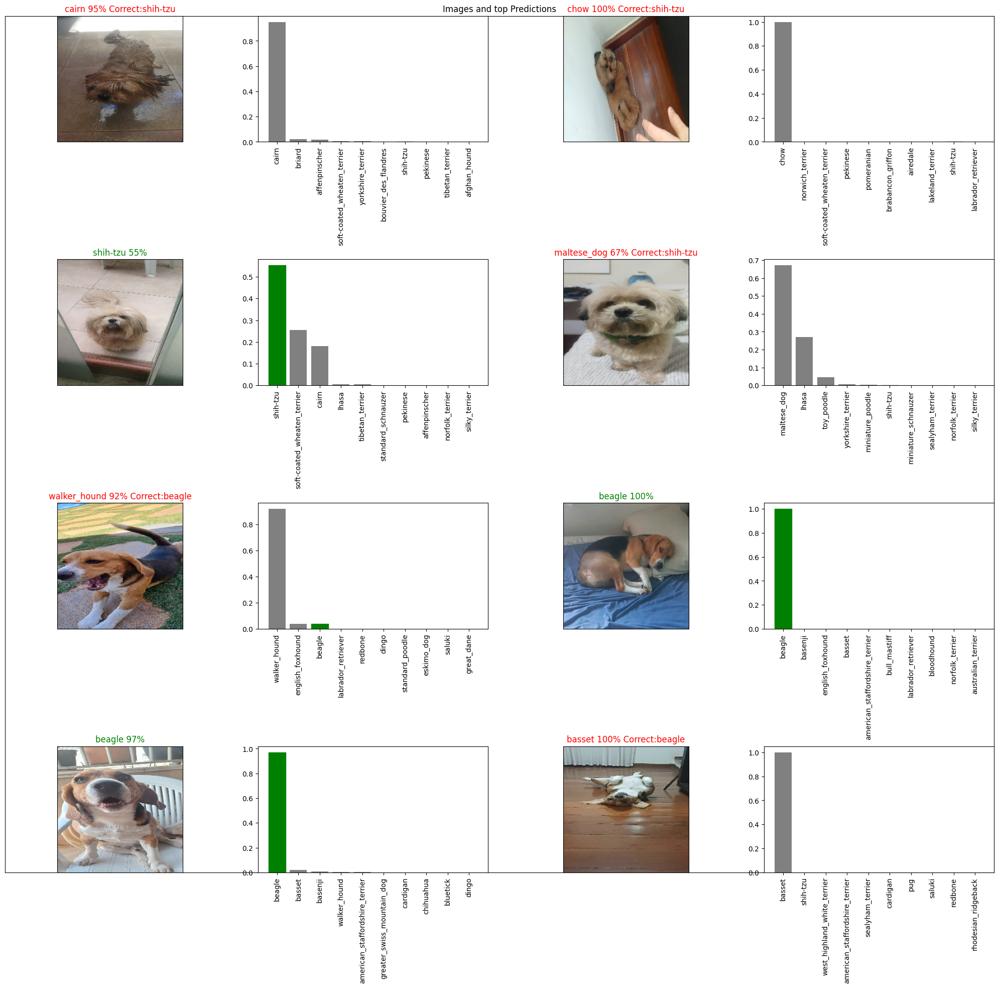

In [ ]:
# plot the prediction
val_labels=['shih-tzu', 'shih-tzu', 'shih-tzu', 'shih-tzu', 'beagle', 'beagle', 'beagle', 'beagle']
val_images = custom_images_path
plot_image_pred_conf_custom(predictions=custom_preds,
                     labels=val_labels,
                     images=custom_images,
                     num_rows= int(len(val_labels)/2),
                     ind_image=0)

### Predicting a unknown breed's dog

Since we don't known what's breed is the dog we can't use the above function

In [ ]:
def plot_prediction_image(images, predictions, num_images):
# setup the figure
  plt.figure(figsize=(10, 10))
  # loop through 25
  for i in range(num_images):
    # Create a subplots
    ax = plt.subplot(4, 4, i+1)
    # Display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(f"{unique_breeds[predictions[i].argmax()]} {np.max(predictions[i])*100:2.0f}%")
    # turn the grid line off
    plt.axis('off')

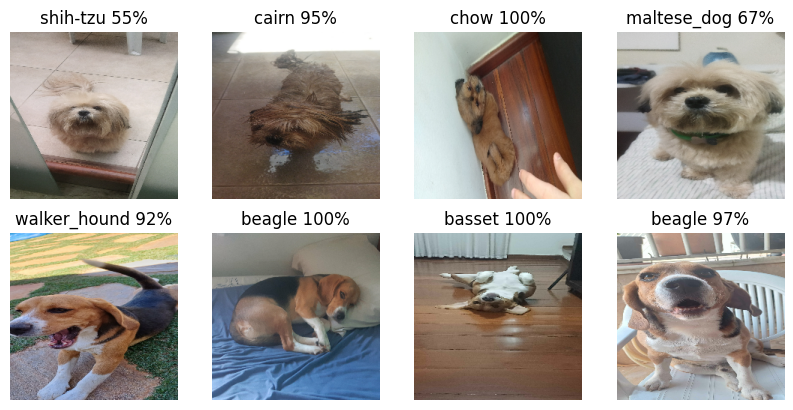

In [ ]:
plot_prediction_image(images=custom_images,
                      predictions=custom_preds,
                      num_images=8)